<a href="https://colab.research.google.com/github/miguebalderrama/AsistConf/blob/master/Balderrama11_03_weed_crop_ys.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Proyecto Weed-crop

In [ ]:
# Chequeo acceso al GPU
!nvidia-smi

# si esto no funciona hay que
# Edit -> Notebook settings -> Hardware accelerator, set it to GPU, and then click Save.

Wed Mar 13 01:47:55 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   46C    P8              10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
# Instalar YOLO Pip install method (recommended)

#!pip install — target=”/content/drive/MyDrive/Colab Notebooks/Yolo8” ultralytics

!pip install ultralytics==8.0.196
from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.4/78.2 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

In [ ]:
# librerias
import pandas as pd
import numpy as np
import torch

import shutil

import random

from PIL import Image
import cv2
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

## Data Description

Como datos para el entrenamiento tomé 2 WeedCrop Image Dataset 2822 imágenes de diferente calidad.

It includes 2822 images. Weed are annotated in YOLO v5 PyTorch format.

The following pre-processing was applied to each image:

  - Auto-orientation of pixel data (with EXIF-orientation stripping)

The following augmentation was applied to create 3 versions of each source image:

  - Equal probability of one of the following 90-degree rotations: none, clockwise, counter-clockwise
  - Random shear of between -15° to +15° horizontally and -15° to +15° vertically
  - Random brigthness adjustment of between -25 and +25 percent

Classes: Crop, Weed

About this directory

  - Train directory contains 2469 images and respective labels in yolov5 Pytorch format.
  - Validation directory contains 235 images and respective labels in yolov5 Pytorch format.
  - Test directory contains 118 images and respective labels in yolov5 Pytorch format.




```
# Esto tiene formato de código
```

##Carga de datos del drive

In [ ]:
# Unir Colab con Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Ruta principal del conjunto de datos en Google Drive

ruta_dataset = '/content/drive/MyDrive/HUMAI/Data_weed_crop'

#ruta_dataset = '/content/drive/My Drive/Dataset/'
#os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/MyDrive/Kaggle"

# Obtener la lista de carpetas en el conjunto de datos (cada carpeta es una clase)
carpetas = os.listdir(ruta_dataset)
carpetas


['data.yaml', 'train', 'valid', 'test']

In [ ]:
# Busca en Kaggle el dataset con el que quieres trabajar en Google Colab. Copiar el APICommand de los 3 puntitos.
# No olvides poner el signo de exclamación antes del comando (!) para que funcione en Google Colab

!kaggle datasets download -d vinayakshanawad/weedcrop-image-dataset

weedcrop-image-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
# descomprimir
!unzip weedcrop-image-dataset.zip




Archive:  weedcrop-image-dataset.zip
replace WeedCrop.v1i.yolov5pytorch/data.yaml? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

# Estructuración y organizacion de imagenes en carpetas

In [ ]:
source_folder = "/content/drive/MyDrive/HUMAI/Data_weed_crop/"#/WeedCrop.v1i.yolov5pytorch"


In [ ]:
# Generar una Version data

# carpeta train
train_source_images = os.path.join(source_folder, "train/images")
train_source_labels = os.path.join(source_folder, "train/labels")

train_destination_folder = "/content/working/train"
os.makedirs(train_destination_folder, exist_ok=True)

# copiar un directorio completo y su contenido de una ubicación a otra.
shutil.copytree(train_source_images, os.path.join(train_destination_folder, "images"))

# desplazamieno de imagenes
shutil.copytree(train_source_labels, os.path.join(train_destination_folder, "labels"))

FileExistsError: [Errno 17] File exists: '/content/working/train/images'

In [ ]:
# carpeta test
test_source_images = os.path.join(source_folder, "test/images")
test_source_labels = os.path.join(source_folder, "test/labels")

test_destination_folder = "/content/working/test"
os.makedirs(test_destination_folder, exist_ok=True)


shutil.copytree(test_source_images, os.path.join(test_destination_folder, "images"))

shutil.copytree(test_source_labels, os.path.join(test_destination_folder, "labels"))

'/content/working/test/labels'

In [ ]:
# carpeta validacion
valid_source_images = os.path.join(source_folder, "valid/images")
valid_source_labels = os.path.join(source_folder, "valid/labels")

valid_destination_folder = "/content/working/valid"
os.makedirs(valid_destination_folder, exist_ok=True)

# Imagenes en movimiento
shutil.copytree(valid_source_images, os.path.join(valid_destination_folder, "images"))

# Desplazamiento de las marcas
shutil.copytree(valid_source_labels, os.path.join(valid_destination_folder, "labels"))

'/content/working/valid/labels'

In [ ]:
def move_files(file_path, source_folder, destination_folder):
    # Lectura de una lista de nombres de archivo
    with open(file_path, "r") as file:
        file_names = [os.path.basename(line.strip()) for line in file.readlines()]

    # Carpetas para imágenes y etiquetas
    images_folder = os.path.join(destination_folder, "images")
    labels_folder = os.path.join(destination_folder, "labels")

    # Traslado de archivos
    for file_name in file_names:
        image_file = os.path.join(source_folder, file_name)
        label_file = os.path.join(source_folder, file_name.replace(".png", ".txt"))
        if os.path.isfile(image_file):
            shutil.copy(image_file, images_folder)
        if os.path.isfile(label_file):
            shutil.copy(label_file, labels_folder)

In [ ]:
# Crear yaml para YOLO
import  yaml

# Data structure
dataset = {
'train': '/content/working/train',
'val': '/content/working/valid',
'test': '/content/working/test',
'nc': 2,
'names': ['crop', 'weed']
}

# save to YAML-file
with open('/content/working/dataset.yaml', 'w') as file:
    yaml.dump(dataset, file)

In [ ]:
!ls /content/working

dataset.yaml  test  train  valid


# Mostrar ejemplo de imagenes

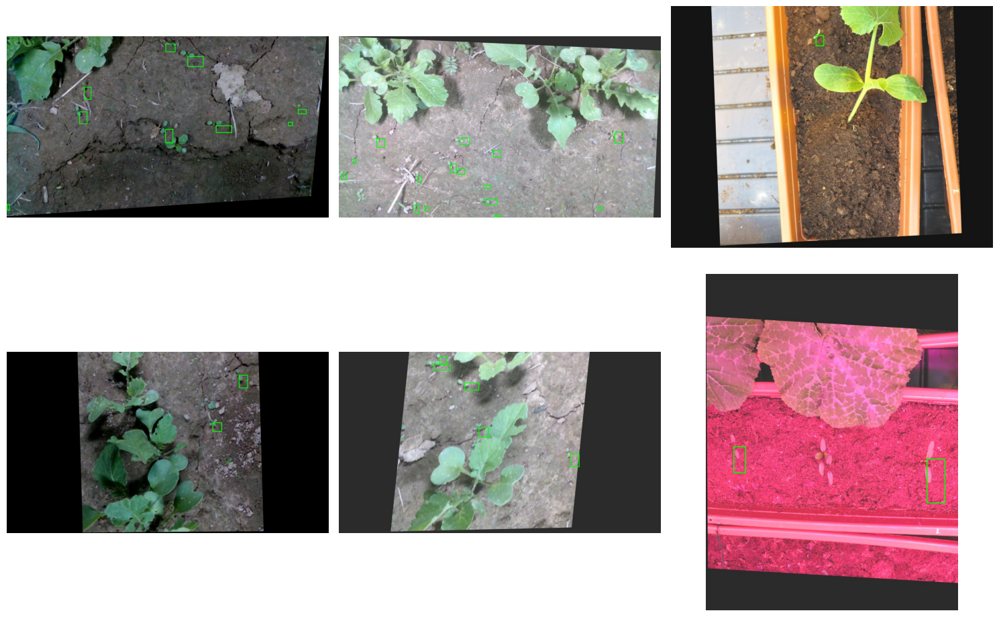

In [ ]:
# Carpetas con imágenes y etiquetas
images_folder = "/content/drive/MyDrive/HUMAI/Data_weed_crop/train/images"
labels_folder = "/content/drive/MyDrive/HUMAI/Data_weed_crop/train/labels"

# Cargar una lista de archivos de imagen
image_files = os.listdir(images_folder)

# Selección de imágenes aleatorias
random.shuffle(image_files)
random_image_files = image_files[:6]

# Mostrar imágenes etiquetadas aleatoriamente
num_images = len(random_image_files)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for i in range(num_images):
    # Cargar una imagen
    image_file = os.path.join(images_folder, random_image_files[i])
    image = cv2.imread(image_file)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Carga de etiquetas desde un archivo
    label_file = os.path.join(labels_folder, os.path.splitext(random_image_files[i])[0] + ".txt")
    with open(label_file, "r") as file:
        labels = file.readlines()

    # Visualización de una imagen etiquetada
    for label in labels:
        class_id, x, y, width, height = map(float, label.strip().split())
        x = int(x * image.shape[1])
        y = int(y * image.shape[0])
        width = int(width * image.shape[1])
        height = int(height * image.shape[0])
        cv2.rectangle(image, (x, y), (x + width, y + height), (0, 255, 0), 2)

    # Visualización de la imagen
    axes[i].imshow(image)
    axes[i].axis("off")

plt.tight_layout()
plt.show()

# Training

In [ ]:
# Activo el GPU
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [ ]:
# Modelo en Yolo
#model = YOLO('yolov8x.pt')

# Load a pretrained YOLO model (recommended for training)
model = YOLO('yolov8n.pt')

100%|██████████| 6.23M/6.23M [00:00<00:00, 279MB/s]


# Entrenamiento

In [ ]:
model.train(data='/content/drive/MyDrive/HUMAI/Data_weed_crop/data.yaml', epochs=50, imgsz=640,
            optimizer = 'AdamW', lr0 = 1e-3,
            project = 'TG_YOLOv8x2', name='Yam',
            batch=8, device=device, seed=69, save_period=10, save=True)

# Results saved to TG_YOLOv8x2/Didi

New https://pypi.org/project/ultralytics/8.1.27 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/drive/MyDrive/HUMAI/Data_weed_crop/data.yaml, epochs=50, patience=50, batch=8, imgsz=640, save=True, save_period=10, cache=False, device=cuda, workers=8, project=TG_YOLOv8x2, name=Yam, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=69, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, stream_buffer=False, line_width=None, v

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# Guardo los resultados de las 50 epocs
from distutils.dir_util import copy_tree

source_folder = '/content/TG_YOLOv8x2'
destination_folder = '/content/drive/MyDrive/Resultados_yolo_50'

# Asegúrate de que la carpeta de destino exista, si no, créala
os.makedirs(destination_folder, exist_ok=True)

# Copiar todo el contenido de la carpeta fuente a la carpeta destino
copy_tree(source_folder, destination_folder)

NameError: name 'os' is not defined

In [ ]:
# reanudar un entrenamiento interrumpido
# Load a model
model = YOLO('path/to/last.pt')  # load a partially trained model

# Resume training
results = model.train(resume=True)



#Train metrics and losses
Yolo es un framework muy conveniente que guarda logs y también gráficos ya hechos de métricas y logs. No inventemos una bicicleta y utilicemos una solución ya hecha.

In [ ]:
#df = pd.read_csv('/content/TG_YOLOv8x/results.csv')
#df = pd.read_csv('/content/TG_YOLOv8x/Didi2/results.csv')
df=pd.read_csv('/content/TG_YOLOv8x2/Yam/results.csv')



In [ ]:
df.columns

Index(['                  epoch', '         train/box_loss',
       '         train/cls_loss', '         train/dfl_loss',
       '   metrics/precision(B)', '      metrics/recall(B)',
       '       metrics/mAP50(B)', '    metrics/mAP50-95(B)',
       '           val/box_loss', '           val/cls_loss',
       '           val/dfl_loss', '                 lr/pg0',
       '                 lr/pg1', '                 lr/pg2'],
      dtype='object')

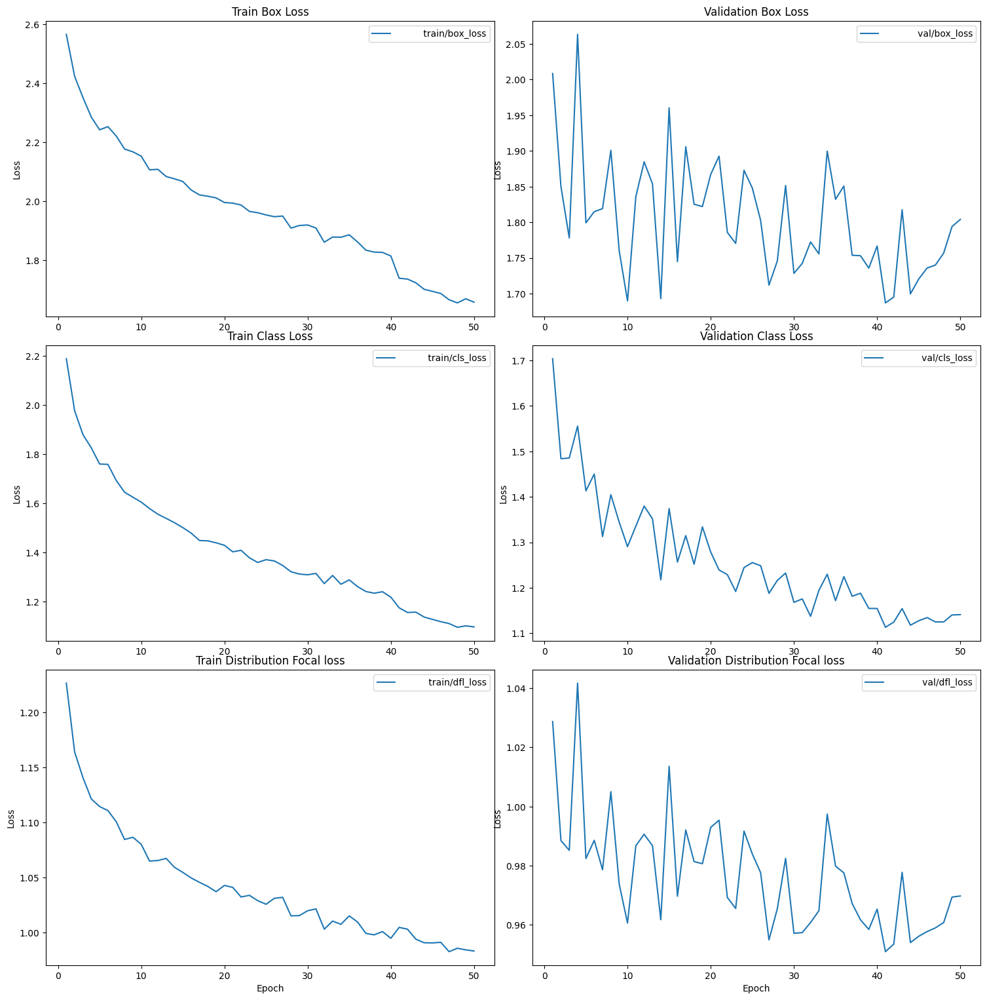

In [ ]:
# Graficos
fig, axes = plt.subplots(3, 2, figsize=(15, 15))
fig.tight_layout()

# train/box_loss
axes[0, 0].plot(df['                  epoch'], df['         train/box_loss'], label='         train/box_loss')
axes[0, 0].set_title('Train Box Loss')
axes[0, 0].set_ylabel('Loss')
axes[0, 0].legend()

# val/box_loss
axes[0, 1].plot(df['                  epoch'], df['           val/box_loss'], label='           val/box_loss')
axes[0, 1].set_title('Validation Box Loss')
axes[0, 1].set_ylabel('Loss')
axes[0, 1].legend()

# train/cls_loss
axes[1, 0].plot(df['                  epoch'], df['         train/cls_loss'], label='         train/cls_loss')
axes[1, 0].set_title('Train Class Loss')
axes[1, 0].set_ylabel('Loss')
axes[1, 0].legend()

# val/cls_loss
axes[1, 1].plot(df['                  epoch'], df['           val/cls_loss'], label='           val/cls_loss')
axes[1, 1].set_title('Validation Class Loss')
axes[1, 1].set_ylabel('Loss')
axes[1, 1].legend()

# train/dfl_loss
axes[2, 0].plot(df['                  epoch'], df['         train/dfl_loss'], label='         train/dfl_loss')
axes[2, 0].set_title('Train Distribution Focal loss')
axes[2, 0].set_xlabel('Epoch')
axes[2, 0].set_ylabel('Loss')
axes[2, 0].legend()

# val/dfl_loss
axes[2, 1].plot(df['                  epoch'], df['           val/dfl_loss'], label='           val/dfl_loss')
axes[2, 1].set_title('Validation Distribution Focal loss')
axes[2, 1].set_xlabel('Epoch')
axes[2, 1].set_ylabel('Loss')
axes[2, 1].legend()

plt.show()

Métricas

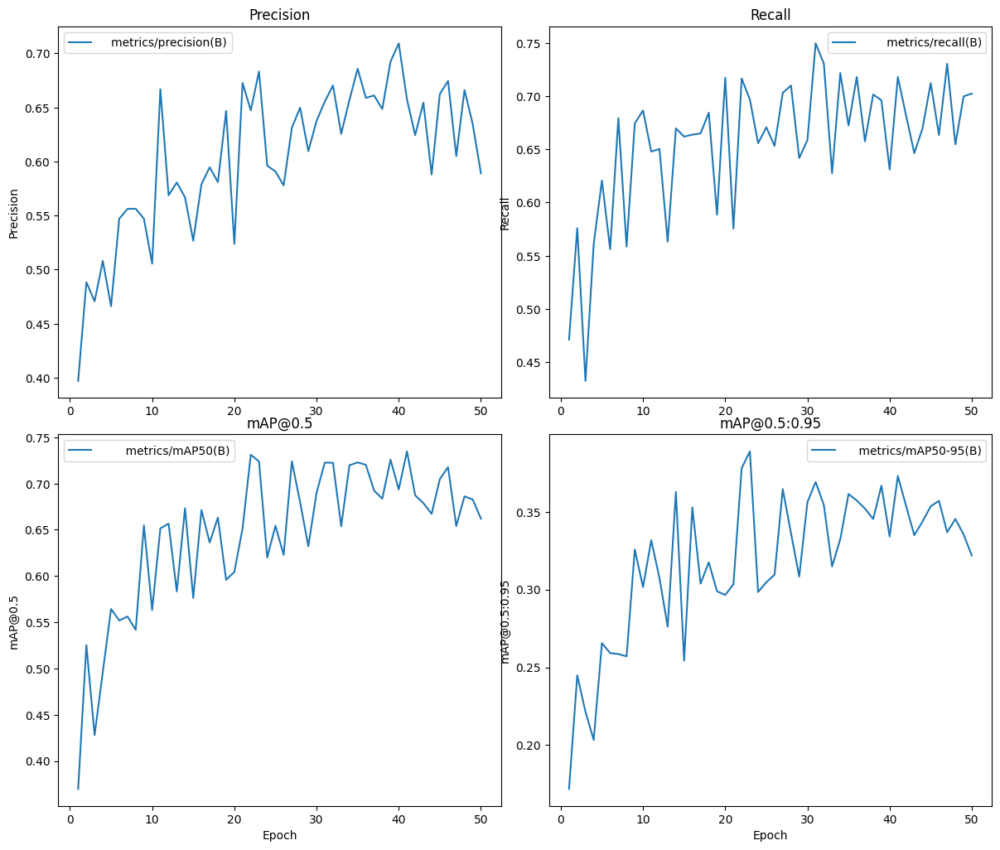

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
fig.tight_layout()

# metrics/precision(B)
axes[0, 0].plot(df['                  epoch'], df['   metrics/precision(B)'], label='   metrics/precision(B)')
axes[0, 0].set_title('Precision')
axes[0, 0].set_ylabel('Precision')
axes[0, 0].legend()

# metrics/recall(B)
axes[0, 1].plot(df['                  epoch'], df['      metrics/recall(B)'], label='      metrics/recall(B)')
axes[0, 1].set_title('Recall')
axes[0, 1].set_ylabel('Recall')
axes[0, 1].legend()

# Gráfico para métricas/mAP50(B)
axes[1, 0].plot(df['                  epoch'], df['       metrics/mAP50(B)'], label='       metrics/mAP50(B)')
axes[1, 0].set_title('mAP@0.5')
axes[1, 0].set_ylabel('mAP@0.5')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].legend()

# metrics/mAP50-95(B)
axes[1, 1].plot(df['                  epoch'], df['    metrics/mAP50-95(B)'], label='    metrics/mAP50-95(B)')
axes[1, 1].set_title('mAP@0.5:0.95')
axes[1, 1].set_ylabel('mAP@0.5:0.95')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].legend()

plt.show()

Más metricas

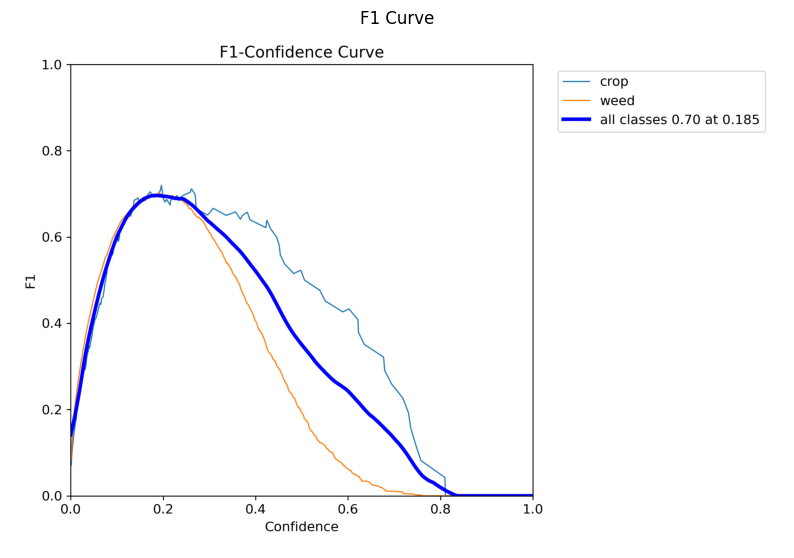

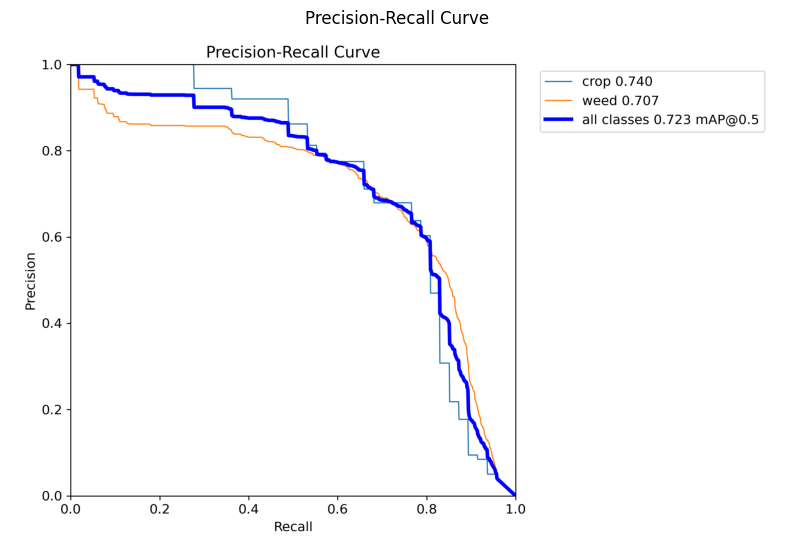

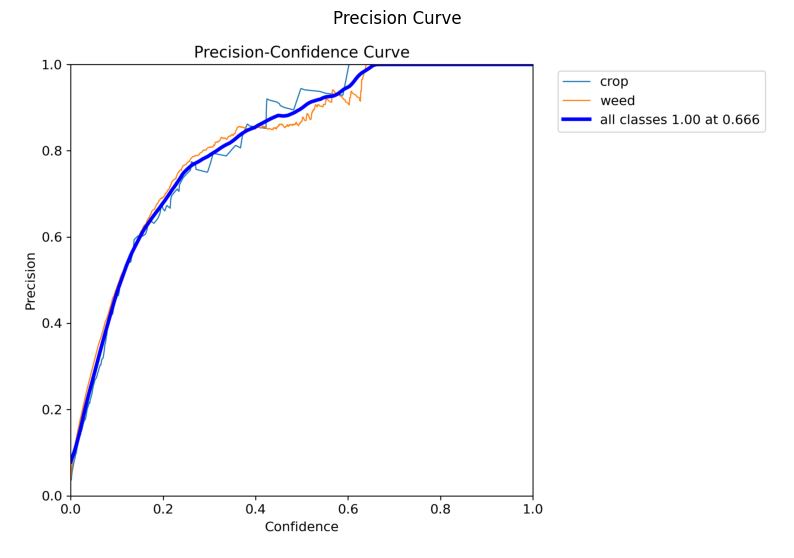

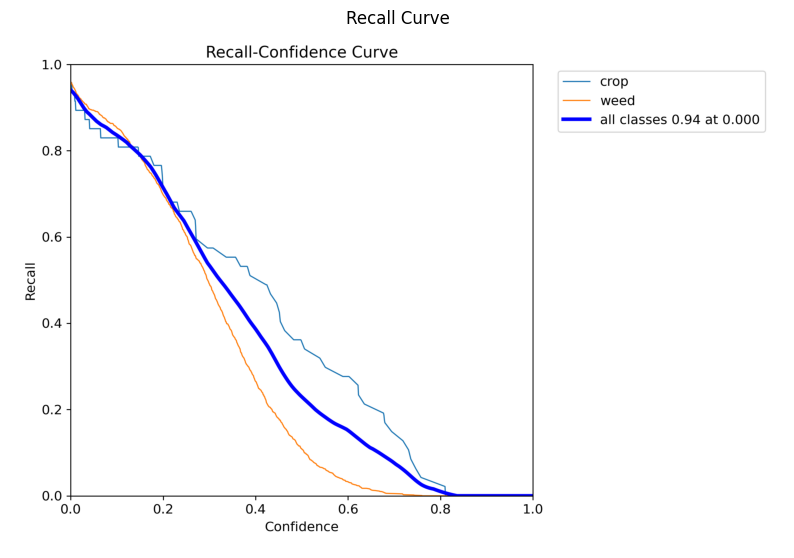

In [ ]:
# F1_curve.png
f1_curve = Image.open("/content/TG_YOLOv8x2/Yam/F1_curve.png")
plt.figure(figsize=(10, 10))
plt.imshow(f1_curve)
plt.title("F1 Curve")
plt.axis("off")
plt.show()

# PR_curve.png
pr_curve = Image.open("/content/TG_YOLOv8x2/Yam/PR_curve.png")
plt.figure(figsize=(10, 10))
plt.imshow(pr_curve)
plt.title("Precision-Recall Curve")
plt.axis("off")
plt.show()

# P_curve.png
p_curve = Image.open("/content/TG_YOLOv8x2/Yam/P_curve.png")
plt.figure(figsize=(10, 10))
plt.imshow(p_curve)
plt.title("Precision Curve")
plt.axis("off")
plt.show()

# R_curve.png
r_curve = Image.open("/content/TG_YOLOv8x2/Yam/R_curve.png")
plt.figure(figsize=(10, 10))
plt.imshow(r_curve)
plt.title("Recall Curve")
plt.axis("off")
plt.show()

Como puede verse en el gráfico de la curva de precisión-recall, los cultivos tienen un alto porcentaje de detección por el modelo, pero las malas hierbas no se detectan tan bien. Se necesitan más datos con malezas etiquetadas.\

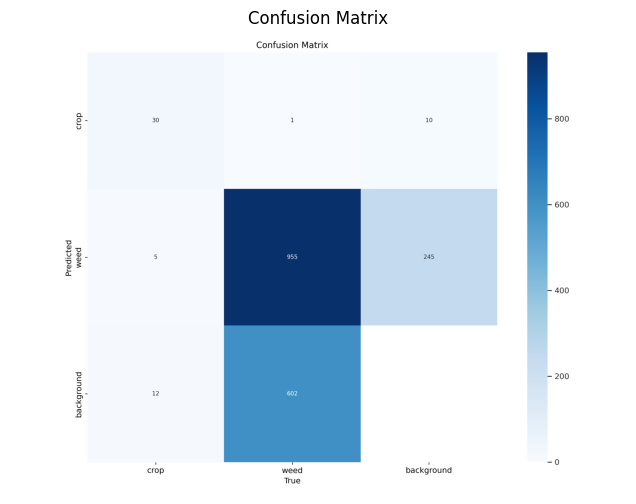

In [ ]:
# confusion matrix
confusion_matrix = Image.open("/content/TG_YOLOv8x2/Yam/confusion_matrix.png")
plt.figure(figsize=(8, 6))
plt.imshow(confusion_matrix)
plt.title("Confusion Matrix")
plt.axis("off")
plt.show()

El mayor número de errores de nuestro modelo se debió a la clasificación errónea de objetos como "fondo" cuando en realidad eran malas hierbas: 903 errores de este tipo. A la inversa, se produjeron 955 errores cuando el modelo clasificó las malas hierbas como "fondo".

En otros casos, el número de errores fue insignificante, en torno a los valores 100-200.

# Evaluación
Con datos test

In [ ]:
# Evaluate the model's performance on the validation set
results = model.val()

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/working/valid/labels.cache... 235 images, 0 backgrounds, 0 corrupt: 100%|██████████| 235/235 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 30/30 [00:07<00:00,  4.09it/s]
                   all        235       1605      0.684      0.685      0.723      0.387
                  crop        235         47      0.657      0.692      0.738      0.455
                  weed        235       1558      0.712      0.679      0.708      0.319
Speed: 0.2ms preprocess, 7.3ms inference, 0.0ms loss, 2.7ms postprocess per image
Results saved to TG_YOLOv8x2/Yam2



image 1/1 /content/working/test/images/12198_jpg.rf.a216dcc7b89a168893ccd130a89553ee.jpg: 384x640 (no detections), 10.8ms
Speed: 2.0ms preprocess, 10.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)


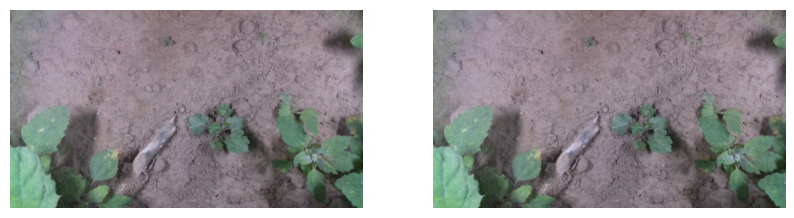

In [ ]:
# Perform object detection on an image using the model
#results = model('https://ultralytics.com/images/bus.jpg')

res = model('/content/working/test/images/12198_jpg.rf.a216dcc7b89a168893ccd130a89553ee.jpg')
detect_img = res[0].plot()
detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Visualización de la primera imagen
axes[0].imshow(plt.imread('/content/working/test/images/12198_jpg.rf.a216dcc7b89a168893ccd130a89553ee.jpg'))
axes[0].axis('off')

# Visualización de los resultados del modelo
axes[1].imshow(detect_img)
axes[1].axis('off')

plt.show();

In [ ]:
# Mantengamos los pesos del modelo en entrenamiento
model = YOLO('/content/TG_YOLOv8x2/Yam/weights/best.pt')


In [ ]:
# conf es el umbral de confianza del objeto para la detección
metrics = model.val(split='test', conf=0.25, device=device)

Ultralytics YOLOv8.0.196 🚀 Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3006038 parameters, 0 gradients, 8.1 GFLOPs
val: Scanning /content/working/test/labels.cache... 118 images, 0 backgrounds, 0 corrupt: 100%|██████████| 118/118 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:07<00:00,  1.09it/s]
                   all        118        781      0.719      0.517      0.606      0.335
                  crop        118         85      0.755      0.471      0.611      0.367
                  weed        118        696      0.684      0.563      0.601      0.303
Speed: 1.0ms preprocess, 9.3ms inference, 0.0ms loss, 6.1ms postprocess per image
Results saved to runs/detect/val2


In [ ]:
metrics

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fbfc3de07c0>
fitness: 0.36215571968290516
keys: ['metrics/precision(B)', 'metrics/recall(B)', 'metrics/mAP50(B)', 'metrics/mAP50-95(B)']
maps: array([    0.36702,     0.30311])
names: {0: 'crop', 1: 'weed'}
plot: True
results_dict: {'metrics/precision(B)': 0.7194178273897724, 'metrics/recall(B)': 0.5169033130493577, 'metrics/mAP50(B)': 0.6059510660037607, 'metrics/mAP50-95(B)': 0.33506734786947673, 'fitness': 0.36215571968290516}
save_dir: PosixPath('runs/detect/val2')
speed: {'preprocess': 1.0347992686902063, 'inference': 9.31496943457652, 'loss': 0.0012749332492634402, 'postprocess': 6.112274477037333}

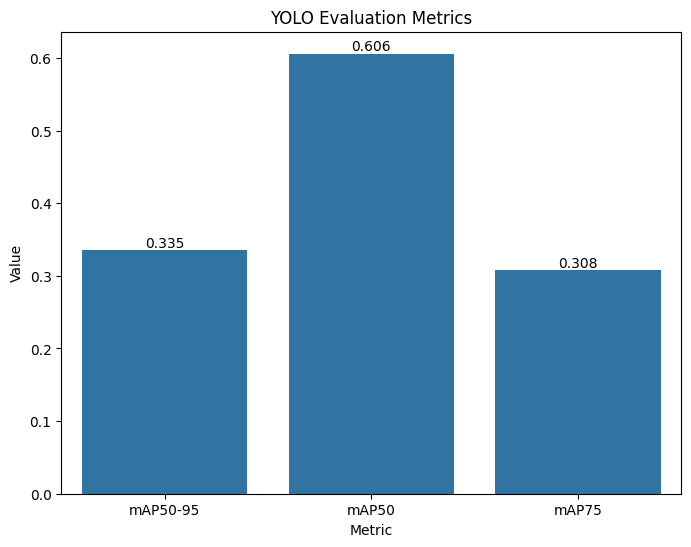

In [ ]:
# YOLO EVAL METRICS
ax = sns.barplot(x=['mAP50-95', 'mAP50', 'mAP75'], y=[metrics.box.map, metrics.box.map50, metrics.box.map75])


ax.set_title('YOLO Evaluation Metrics')
ax.set_xlabel('Metric')
ax.set_ylabel('Value')


fig = plt.gcf()
fig.set_size_inches(8, 6)

for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')


plt.show()

Así, el modelo muestra una mayor precisión en la detección de objetos con umbrales de confianza más bajos, mientras que con umbrales más altos su precisión disminuye. Esto puede deberse a que, con umbrales de confianza altos, el modelo se vuelve más conservador y pasa por alto algunos objetos para reducir la probabilidad de falsos positivos.

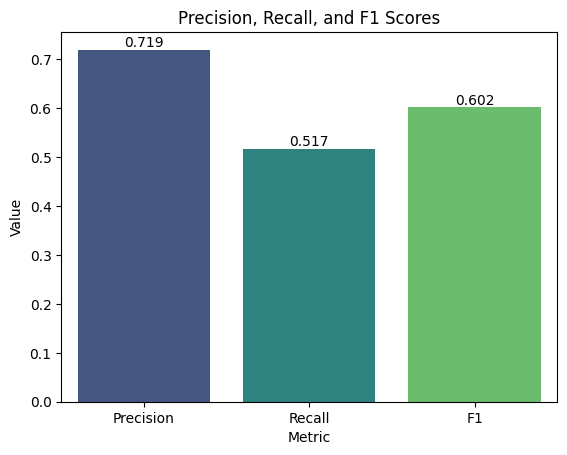

In [ ]:
# Recuperación de los valores Precision, Recall y F1
precision = metrics.results_dict['metrics/precision(B)']
recall = metrics.results_dict['metrics/recall(B)']
f1 = (2 * precision * recall) / (precision + recall)  # Вычисление F1


metrics = ['Precision', 'Recall', 'F1']
values = [precision, recall, f1]

# Creación de un gráfico con sns.barplot
ax = sns.barplot(x=metrics, y=values, palette='viridis')

ax.set_title('Precision, Recall, and F1 Scores')
ax.set_xlabel('Metric')
ax.set_ylabel('Value')

for p in ax.patches:
    ax.annotate('{:.3f}'.format(p.get_height()), (p.get_x() + p.get_width() / 2, p.get_height()), ha='center', va='bottom')

plt.show()

Como se puede ver en las métricas, la "Precisión" del modelo es bastante buena, reconoce bien ambas clases y las encuentra más o menos con la misma puntuación.

Veamos 10 imágenes aleatorias

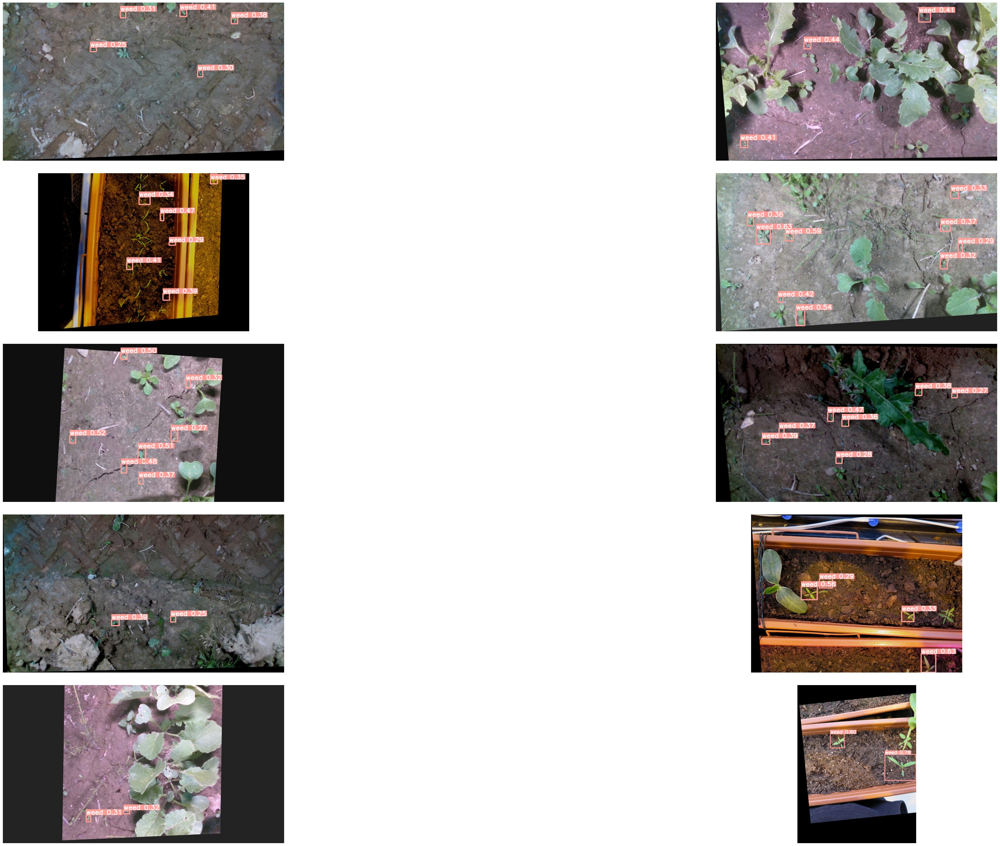

In [ ]:
# Obtención de imágenes aleatorias
image_paths = random.sample(os.listdir(images_folder), 10)

# Creación de una figura con subventanas y ampliación del tamaño de la foto
fig, axes = plt.subplots(5, 2, figsize=(50, 30))
fig.tight_layout()

# Iterar sobre cada subventana
for i, ax in enumerate(axes.flat):
    image_path = os.path.join(images_folder, image_paths[i])
    image = Image.open(image_path)
    res = model(image, verbose=False)
    detect_img = res[0].plot()
    detect_img = cv2.cvtColor(detect_img, cv2.COLOR_BGR2RGB)

    ax.imshow(detect_img)
    ax.axis('off')

plt.show()

# Conclusión

En este cuaderno, entrenamos el modelo YOLOv8x en datos agrupados, estudiamos las métricas y las pérdidas durante el entrenamiento, y analizamos el resultado del modelo en múltiples imágenes y la calidad de la detección en datos de prueba.

Se recomienda seguir investigando para lograr un mejor rendimiento del modelo y aplicarlo con éxito a los procesos empresariales. He aquí algunas medidas que pueden adoptarse:

Recopilar más datos: Una mayor cantidad y variedad de datos ayudará al modelo a generalizar y reconocer mejor los objetos. Se pueden recopilar nuevos datos o encontrar conjuntos de datos disponibles para complementar el conjunto de entrenamiento actual.

Personalizar los hiperparámetros: La selección de los hiperparámetros óptimos del modelo puede afectar significativamente a su rendimiento. Se puede experimentar con distintos valores de hiperparámetros, como tamaños de ancla, umbrales de confianza y otros, para lograr mejores resultados.

Realizar experimentos adicionales: Experimentar con diferentes arquitecturas del modelo, variaciones de YOLOv8 u otros modelos de detección de objetos, puede conducir a mejores resultados.

Etc.

En general, una investigación más precisa (en particular, se necesitan más datos etiquetados con etiquetas y cajas de maleza), la experimentación y el trabajo en la mejora del modelo conducirán a un mejor rendimiento y aumentarán su aplicabilidad en escenarios empresariales reales. Por supuesto, todo depende de los recursos, tanto computacionales como monetarios.

Traducción realizada con la versión gratuita del traductor www.DeepL.com/Translator

# Inferencia

In [ ]:
# Modificar
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True


In [ ]:
# Ver una imagen con globitos y %
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict3/*.jpg')[:3]:
      display(Image(filename=image_path, width=600))
      print("\n")